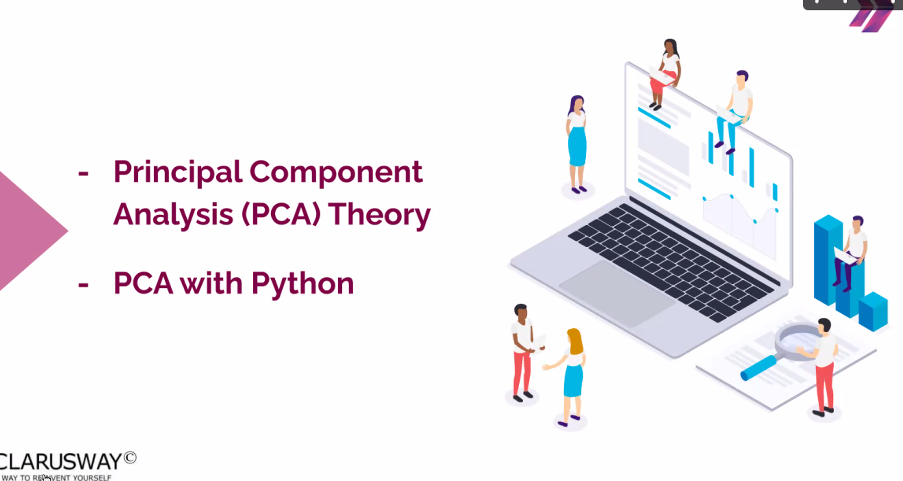

In [1]:
# PCA , unsupervised learning altında geçiyor ama bir learning yapmıyor
# Datamızı bir yerden alıyor başka boyuta taşıyor
# Kısaca PCA deyince aklımıza "boyut indirgeme" gelecek
# Boyutun laneti: Verideki her bir "değişkenimiz" aslında bir "boyuttur". Bu da bazı sorunlar beraberinde getirir
# 20 boyuta çıktığmızda 95 trilyonluk bir datadan bahsediyoruz
# Datanın çok olması iyi ama sistemimizi yoruyor, değerlendirme zorlukları oluyor vs vs
# Modelin genelleştirme yapacağı ölçüde datanın boyutunun olmasını istiyoruz(Ne çok ne az)

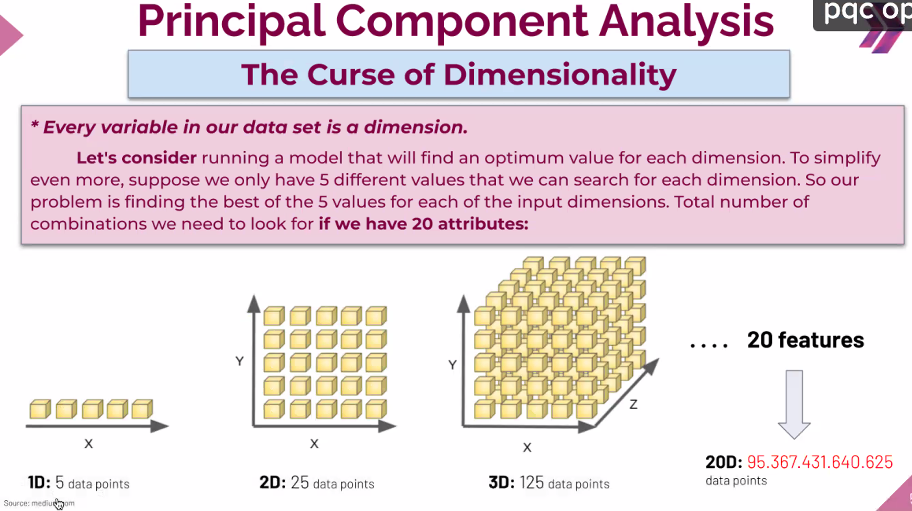

In [2]:
# Pairplot çizdirmeye çalışsak bunların analizleri de sıkıntı olabiliyor. İlişkilerine bakmak vs
# Burada çok boyut olsa bu ciddi sıkıntılar oluşturabilir

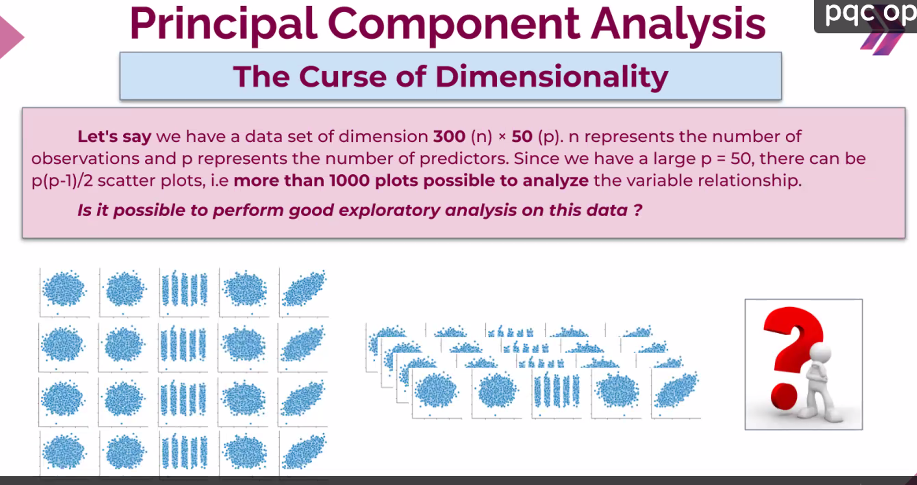

In [3]:
# Model bu feature ların hepsini tarayıp anlayıp genelleştirme yapması zorlaşabilir
# Günümüzde büyük makinalar var ancak bazı problemlerde günde 50 kere yapmanız gereken
# .. bir model olduğunu düşünün buralarda calculation time ları önemli ve büyük şirketler
# .. için "cost" kısmı önemli(Bulut ve depolama sistemlerine ödedikleri para açısından)
# Feature sayısını arttırırken featurelara bağlı olarak sample sayısı da artmalıydı. Bu da
# .. yüksek boyutun getirdiği başka bir sorun bize

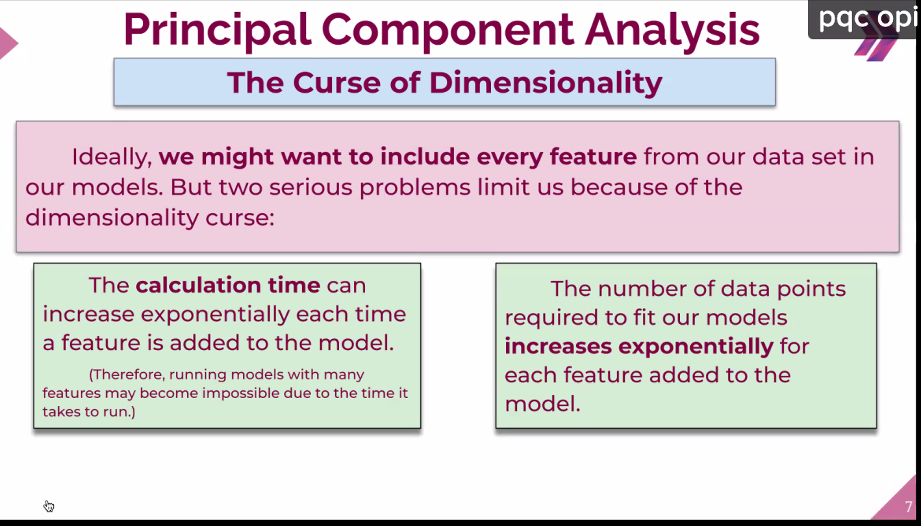

In [4]:
# Boyut indirgeme de 2 adet yaklaşım var
    # 1.Feature Selection: Bizim için en önemli featureları alabiliriz
    # 2.Feature Transform: PCA burada devreye giriyor. Boyutu dönüşüm yaparak indirgiyor. Birazdan bakacağız
        # .. Datalar aynı datalar değil dönüşmüş datalar. Scaling mantığıyla düşünülebilir

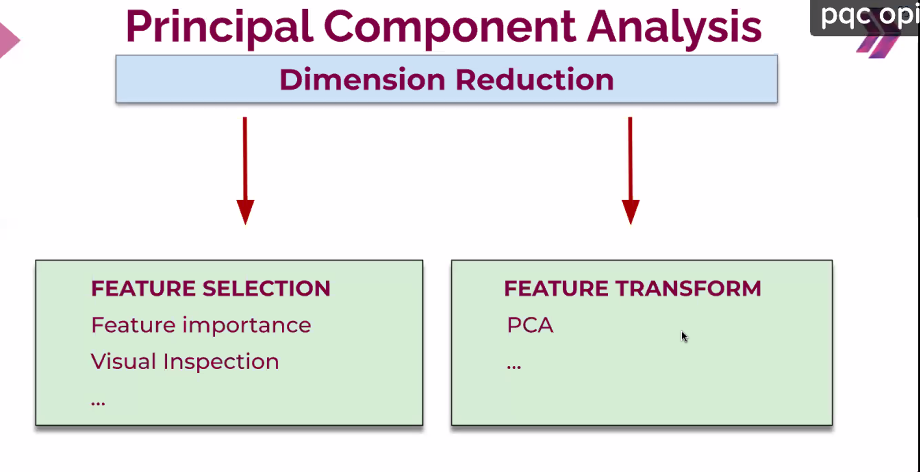

In [5]:
# Ne için buna ihtiyacımız var
    # 1.EDA yaparken zorlanmamız
    # 2.Üç boyuttan fazlası görselleştirme için problem
    # 3.Boyut arttıkça complexity artıyor. Bu da bir sorun(overfit olma ihtimali vs)
    # 4.Feature sayısı artarsa gözlem sayısını da arttırmamız lazım(1 e 20, 1 e 50 oranda arttırmak gibi yaklaşımlar var)

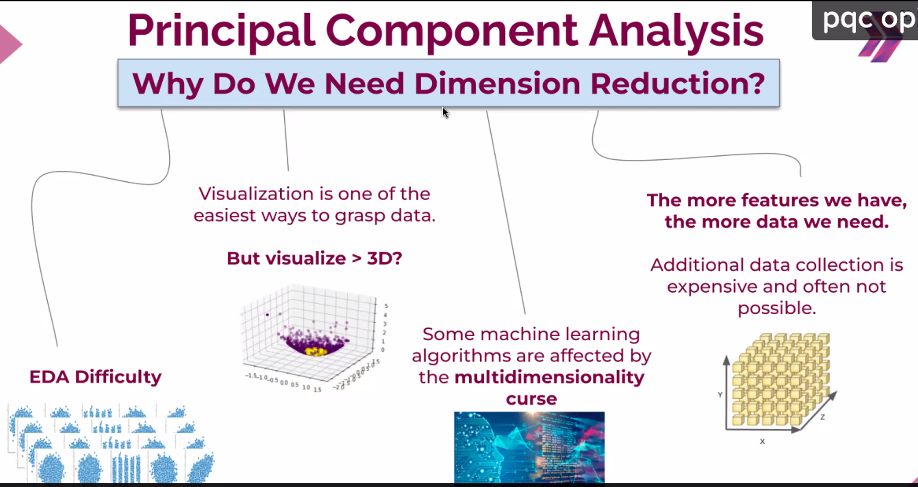

In [6]:
# Boyut indirgeme ile ilgili çok yöntem var ama en çok bilineni PCA dir
# 1901(PCA in ilk çıktığı zaman)
# Datamızın sol taraftaki gibi 3 boyutu var. Bunları ayrıştırmak çok kolay değil
# PCA ile ayrıştırmayıda kolaylaştırmış oluyoruz. Hem de başka bir alana girerek temel bileşenlerini 
# .. tespit ederek soldaki grafiği sağdaki grafik ile temsil edebiliyorum
# Kaç boyutlu ise o kadar principal component üretilir(Örneğin: 40 feature için 40 bileşen)
# Biz en güçlü(en çok bilgi içeren) ilk 15 bileşeni kullanıp ona göre modeli eğitebilirim
# Buradaki şekilde de 2 bileşen alarak bu bileşenlerle çalışabilirim

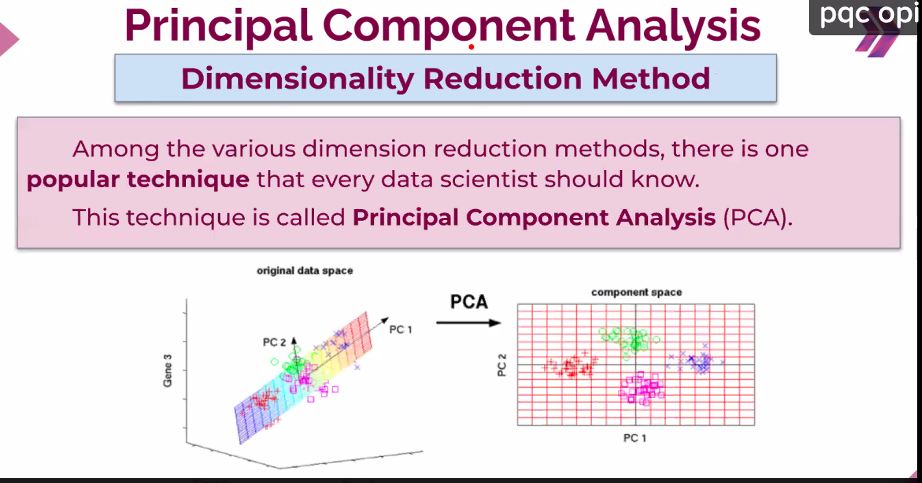

In [7]:
# Buradaki gölge bize temel bazı bilgiler veriyor
# Ama bir yüz, göz, kıyafet bilgileri yok

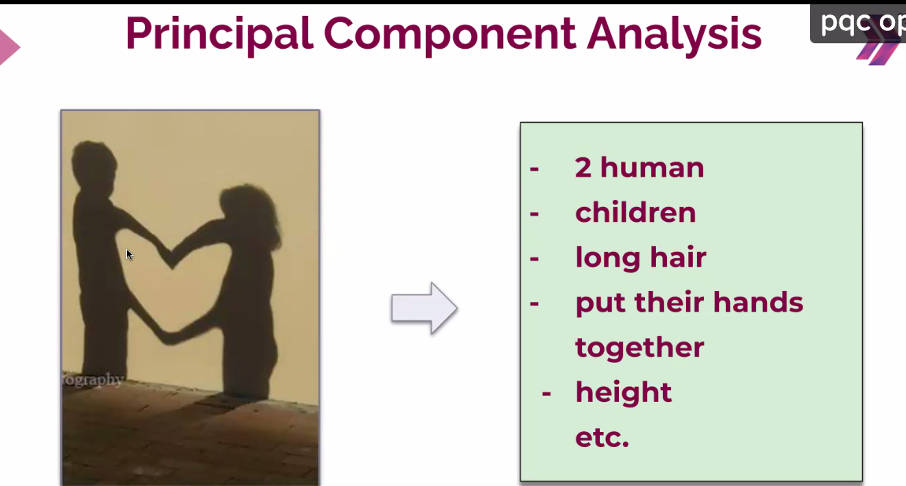

In [8]:
# Resmin gerçek hali böyle ama biz gölgeye bakarak da(indirgenmiş boyutta) bir şeyler elde edebiliyoruz
# Datanın çok az bir kısmını kullanarak boyut indirgemiş oluyoruz

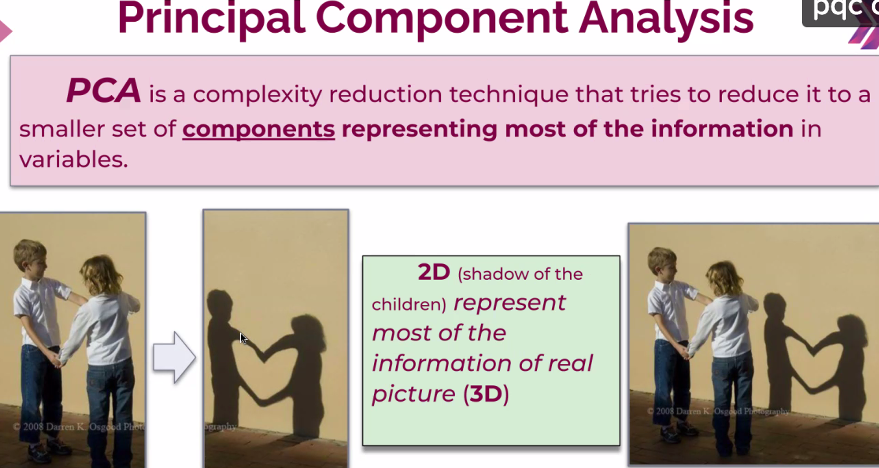

In [9]:
# Pembe, mavi, sarı bizim featurelarımız olsun. Bunların ortasındaki %70 lik bilgiyi çıkartabiliriz mesela
# Sağdaki şekilde de datamın bir değişimi var. Varyansı var. V1 konumunda(V1 bir vector bu arada) varyans en büyük halinde oluyor

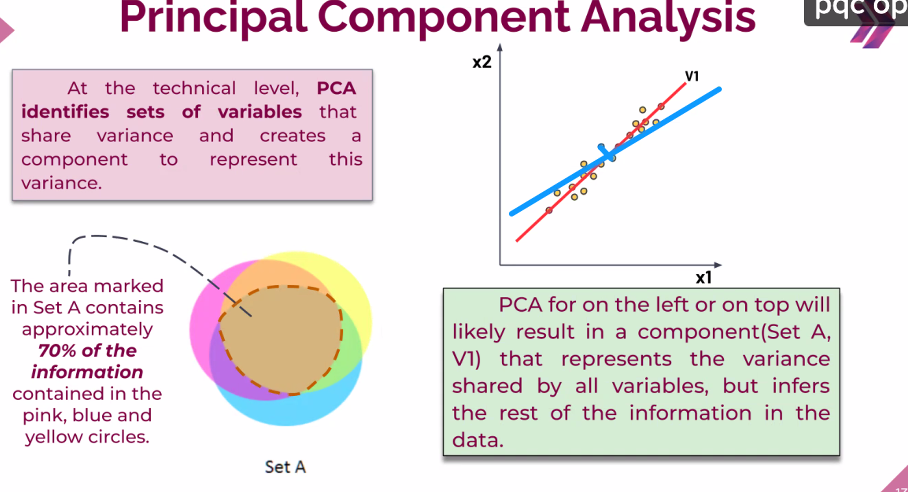

#### Class chat ten
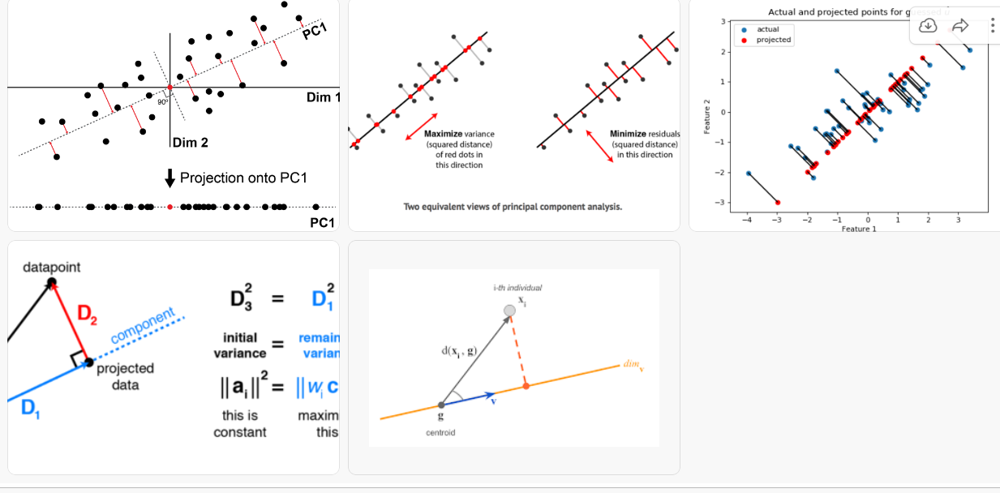

##### Class chatten
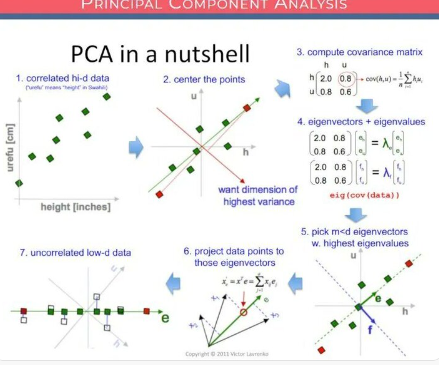

In [10]:
# Alttaki sitede üstteki sağdaki şeklin bir animasyonu var

# En yüksek information ı içeren bileşenler çıkarmaya çalışıyor PCA
# Bu informationdan anladığımız şey değişimdir.
# Animasyonda kırmızı noktaların dağılımı birbirine giriyor. 
# Doğru üzerindeki değişim büyümüş oluyor(Üstteki şekilde kırmızının olduğu yere geldiğinde)
# En fazla değişim o anda var(animasyondaki doğru üstteki resimde kırmızı durumda iken 
# (Doğru, best fit line konumunda iken gibi düşünebiliriz)).
# .. Bu vektörler en büyük değişimin yönünü gösterir

https://builtin.com/data-science/step-step-explanation-principal-component-analysis

In [11]:
# Vektörlerim yüksek varyansa bakıyor PCA de
# Eigen vectorlerimiz(Öz vektörler) var 2 vektörümüz oluşacak
# 1. si (V1) yönünü gösteriyor. En yüksek varyanslı
# 2. si diğerine dik olur. 
# Eigen value ları bu vectorler üzerine projection yaparız
# Lambda, Genliğini(Başlangıç ve bitişini) gösterir(Lambdayı altta formül var göreceğiz)

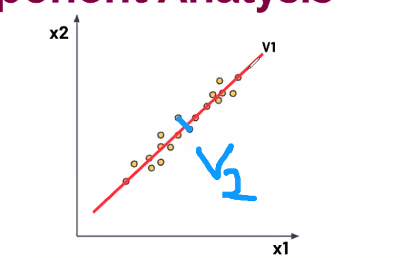

In [12]:
# Açıklanan varyans grafiği
# 1. bileşen %22 bileşen içermiş 2. si %14 vs vs
# Burada 18 tane boyut varmış
# Buradaki 3 tane sini alırım(%50 lik bir bilgi var)
# Ya da ilk 7 sini alıp(%80 lik bir bilgim var). 18 boyutu 7 boyuta indirdik.

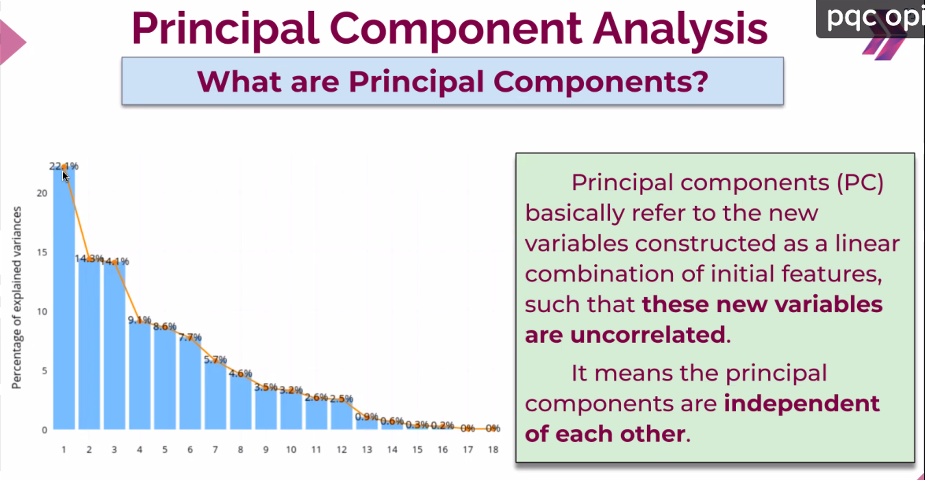

In [13]:
# PCA yaparken sırayla arka planda olan şeyler
    # 1.Standardization(Mean=0, std=1)
    # 2.Covariance matrisi: 2 datanın birbirlerine göre değişimlerine bakar. Kare olmak zorunda
    # 3.Eigenvector ve eigenvalues(lambda) lerini hesaplattırıyoruz(Boyut 6 ise 6 tane eigen vector ve eigen vector)
    # 4.En yüksekten en düşüğe göre eigenvalues leri sıralattırırırız. En yüksek 4 tanesini alıyoruz
    # 5.Sıralattıktan sonra projecting(Datayı bir yerden başka bir yere/şekle dönüştürürürüz(4 boyuta indirgeriz))
    # En son 4 tanesini alıyoruz bunlar benim için principal component diyoruz

# Class chat soru: eigen value'lara burada component mi dedik Hocam?
# NOT:Eigen value ler en güçlü eigen vektorleri tespit ederler. Component değildirler

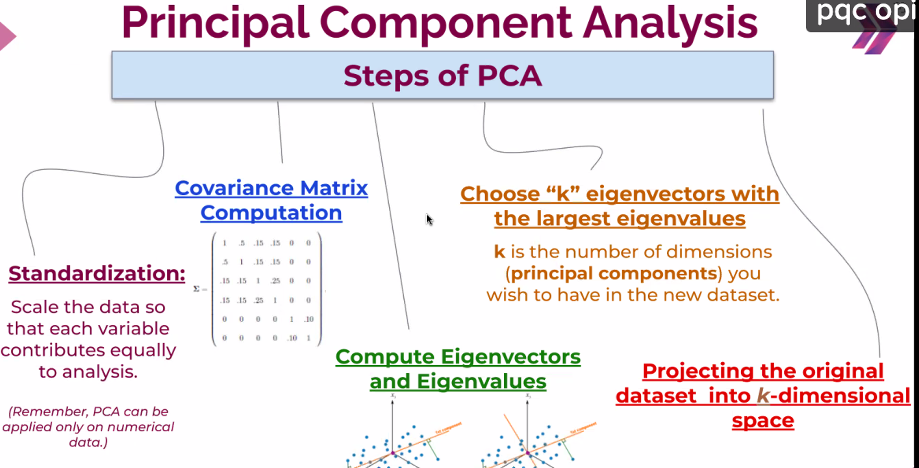

In [14]:
# Eigen value ve eigenvector lerin bulunması teorik bilgiler
# NOT: "I" : Birim matris
# Bunları bilmemiz şart değil ama göstermek istedik. Uygulamada net anlayacağız

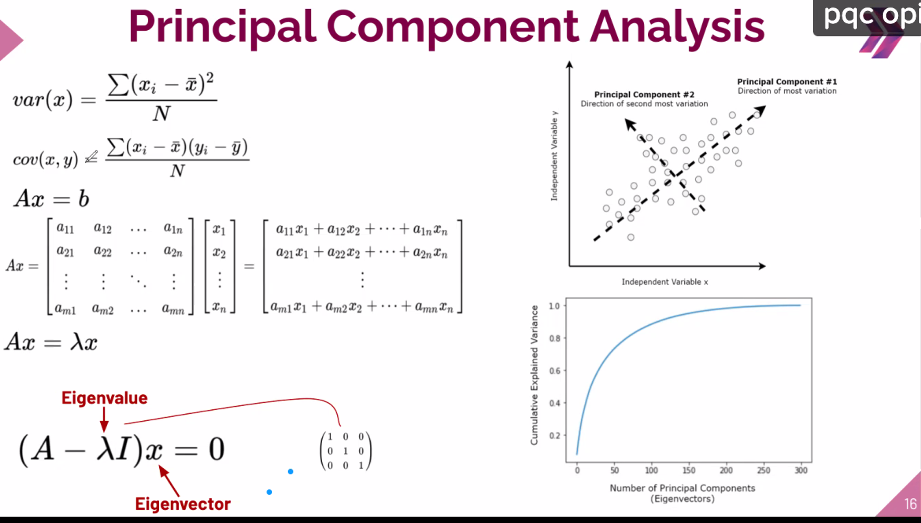

In [15]:
# Kütüphanesi

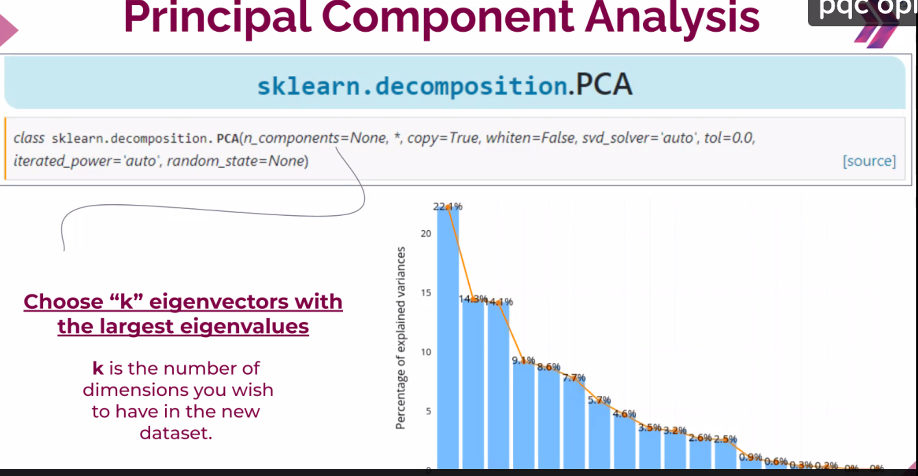

In [16]:
# Avantajları
    # Elde ettiğimiz eigen vectorler birbirine mutlaka diktir ve ilişki 0 olur(Vektörel çarpımları 0 olur. Cosinüs 0 dan geliyor)
    # Performansı arttırır
    # Kompleksiti artınca overfitting düşer
    # Görselleştirmek daha rahat olur

# Dezavantajları
    # Featurelarım değiştiği için yorumlamakta zorlanırız
    # Standartization gerekli
    # Boyut indirgergen kazancımız var ama information kaybediyoruz

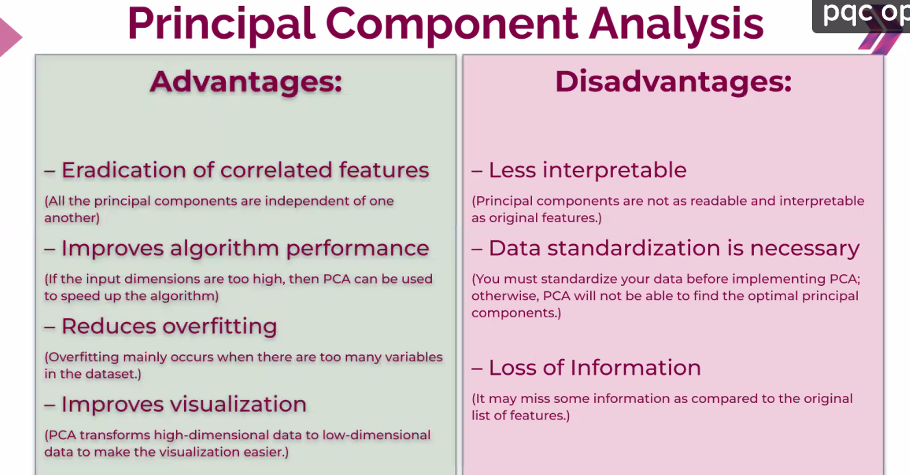

In [17]:
### Class chat: https://online.stat.psu.edu/stat505/lesson/11/11.4

In [18]:
# PCA ile Random Forest kullanarak Classification yapacağız
# Random forest bir bagging(Bootstrap aggregating) yöntemiydi
# XGBoost, GMB, Adaboost , boosting yöntemlerdi

<a id = '4.0'></a>
<p style = "font-size : 50px; color : #34656d ;  text-align : center; background-color : #08f9f9; border-radius: 5px 5px;"><strong>PCA with Supervised Learning Algorithms</strong></p>

## <span style='color:red'> Classificaton by Random Forest</span> 

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import seaborn as sns
from matplotlib.pyplot import matplotlib
plt.rcParams["figure.figsize"] = (10,6)

### EDA

These data are the results of a chemical analysis of wines grown in the same region in Italy but derived from three different cultivars. The analysis determined the quantities of 13 constituents found in each of the three types of wines.

In [20]:
df = pd.read_csv("Wine.csv")
# Italya da aynı bölgede 3 farklı şekilde yetiştirilmiş
# 13 tane feature var
# Bu 13 feature a göre hangi segmente ait olduğunu tahmin edeceğiz

In [21]:
df.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,Customer_Segment
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1


In [22]:
df.shape

(178, 14)

In [23]:
df.Customer_Segment.unique()

array([1, 2, 3])

In [24]:
df.Customer_Segment.value_counts()

2    71
1    59
3    48
Name: Customer_Segment, dtype: int64

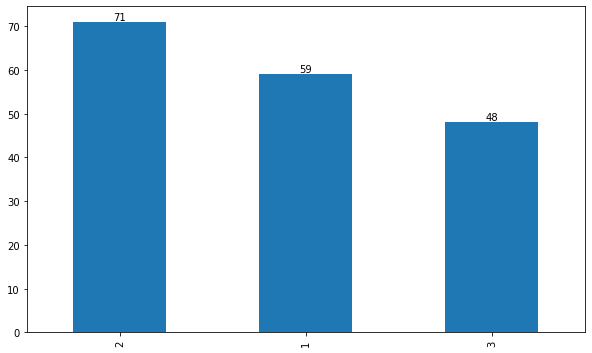

In [25]:
ax = df.Customer_Segment.value_counts().plot.bar()
ax.bar_label(ax.containers[0]);

In [26]:
df.describe()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,Customer_Segment
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258,1.938202
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474,0.775035
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000,1.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000,1.000000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000,2.000000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000,3.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000,3.000000


<AxesSubplot:>

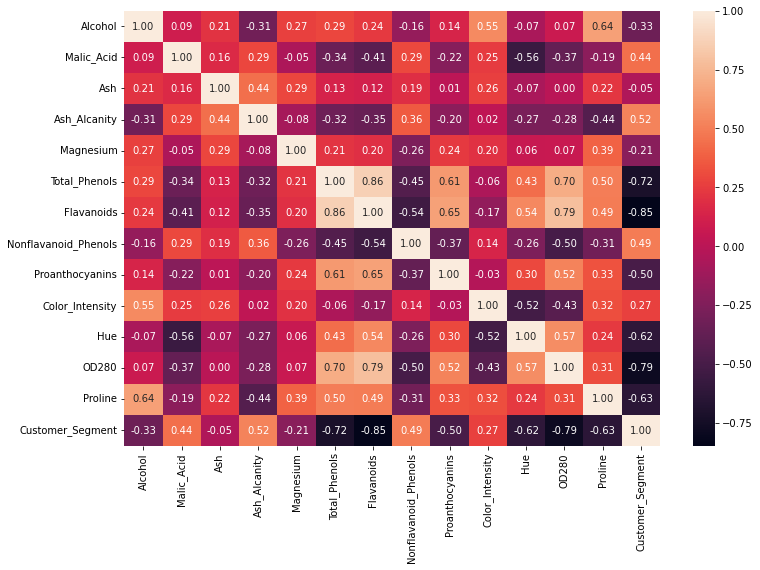

In [27]:
plt.figure(figsize=(12,8))
sns.heatmap(df.corr(), annot = True, fmt=".2f")

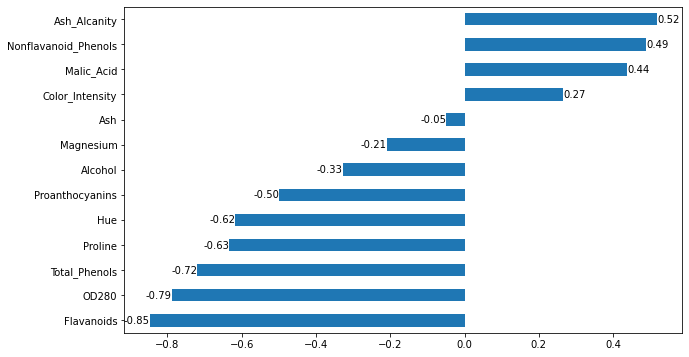

In [28]:
ax = df.corr()["Customer_Segment"][:-1].sort_values().plot(kind="barh")
ax.bar_label(ax.containers[0], fmt="%.2f");
# Her bir feature ın customer segment ile olan korelasyonu
# Ash_alcanity ve flavanoids customer segmenti belirleyiciymiş

In [29]:
df.isnull().sum().any()

False

### Split the Data

In [30]:
# Not: Kategorik datamız olmadığı için ordinal encoding ile uğraşmayacağız

In [31]:
X = df.drop("Customer_Segment", axis = 1)

In [32]:
y = df["Customer_Segment"]

In [33]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify=y, random_state = 0)

### Modeling 

In [34]:
from sklearn.metrics import confusion_matrix, classification_report

In [35]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [36]:
from sklearn.ensemble import RandomForestClassifier

In [37]:
classifier = RandomForestClassifier(random_state = 0)
classifier.fit(X_train, y_train)
eval_metric(classifier, X_train, y_train, X_test, y_test)
# Modelleme bitmiş oldu. Hepsini çok güzel ayırt etmiş

Test_Set
[[12  0  0]
 [ 0 14  0]
 [ 0  0 10]]
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        12
           2       1.00      1.00      1.00        14
           3       1.00      1.00      1.00        10

    accuracy                           1.00        36
   macro avg       1.00      1.00      1.00        36
weighted avg       1.00      1.00      1.00        36


Train_Set
[[47  0  0]
 [ 0 57  0]
 [ 0  0 38]]
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        47
           2       1.00      1.00      1.00        57
           3       1.00      1.00      1.00        38

    accuracy                           1.00       142
   macro avg       1.00      1.00      1.00       142
weighted avg       1.00      1.00      1.00       142



In [38]:
# Cross validation
from sklearn.model_selection import cross_validate
model = RandomForestClassifier(random_state = 0)
scores = cross_validate(model, X_train, y_train, scoring = ['accuracy', 'precision_micro','recall_micro','f1_micro'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]
# NOT: Micro dediğimizde "accuracy" ile aynı sonuçları verir
# Gerçek accuracy miz 0.97 imiş

test_accuracy           0.971905
test_precision_micro    0.971905
test_recall_micro       0.971905
test_f1_micro           0.971905
dtype: float64

In [39]:
classifier.feature_importances_

array([0.12930939, 0.02858818, 0.01005337, 0.02107876, 0.02670528,
       0.04826478, 0.17041694, 0.01237242, 0.01801449, 0.17606478,
       0.06869346, 0.09987653, 0.19056163])

In [40]:
feats = pd.DataFrame(index=df.iloc[:,:-1].columns, data= classifier.feature_importances_, columns=['Importance'])
imp_feats = feats.sort_values("Importance")
imp_feats
# En önemli feature lar Proline, Color_intensity, Flavanoids ...
# Class chat soru: hocam korelasyonu yüksek olan feature ın impportance ı daha yüksek olur diyemez miyiz. Çünkü  yukarısa en yüksek korelasyon Flavanoids idi.
# John Hoca: Tam diyemeyiz. O korelasyon data ile ilişkisi var ama uzaydaki ayrılmalarında modelin iç yapısı çok önemli

,Importance
Ash,0.010053
Nonflavanoid_Phenols,0.012372
Proanthocyanins,0.018014
Ash_Alcanity,0.021079
Magnesium,0.026705
Malic_Acid,0.028588
Total_Phenols,0.048265
Hue,0.068693
OD280,0.099877
Alcohol,0.129309


In [41]:
imp_feats.sort_values('Importance')

,Importance
Ash,0.010053
Nonflavanoid_Phenols,0.012372
Proanthocyanins,0.018014
Ash_Alcanity,0.021079
Magnesium,0.026705
Malic_Acid,0.028588
Total_Phenols,0.048265
Hue,0.068693
OD280,0.099877
Alcohol,0.129309


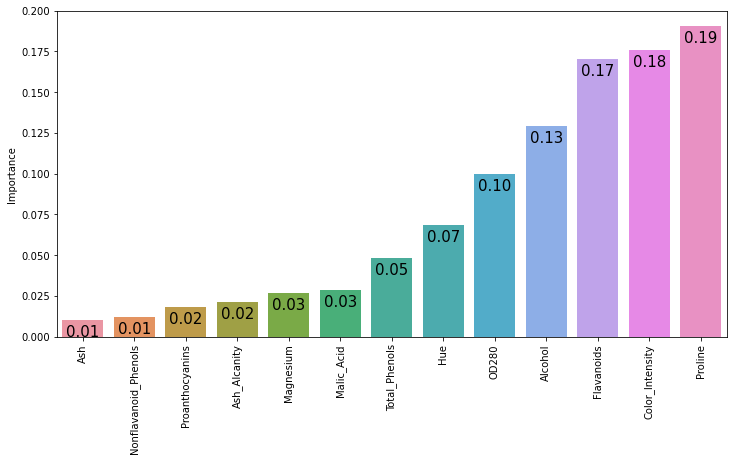

In [42]:
plt.figure(figsize=(12,6))
splot = sns.barplot(data=imp_feats.sort_values('Importance'),x=imp_feats.sort_values('Importance').index,y='Importance')
plt.xticks(rotation=90)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.2f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   size=15,
                   xytext = (0, -12), 
                   textcoords = 'offset points')

## <span style='color:red'> Modeling by feature importance (feature selection)</span> 

In [43]:
X2 = df[["Proline", "Color_Intensity", "Flavanoids"]] # Bu 3 feature lara göre sonuç bakalım

In [44]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y, test_size = 0.2, stratify=y, random_state = 0)

In [45]:
classifier2 = RandomForestClassifier(random_state = 0)
classifier2.fit(X_train2, y_train2)
eval_metric(classifier2, X_train2, y_train2, X_test2, y_test2)

# Test te düşüş oldu çünkü sadece 3 feature kullandık.

Test_Set
[[12  0  0]
 [ 0 14  0]
 [ 0  1  9]]
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        12
           2       0.93      1.00      0.97        14
           3       1.00      0.90      0.95        10

    accuracy                           0.97        36
   macro avg       0.98      0.97      0.97        36
weighted avg       0.97      0.97      0.97        36


Train_Set
[[47  0  0]
 [ 0 57  0]
 [ 0  0 38]]
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        47
           2       1.00      1.00      1.00        57
           3       1.00      1.00      1.00        38

    accuracy                           1.00       142
   macro avg       1.00      1.00      1.00       142
weighted avg       1.00      1.00      1.00       142



In [46]:
model = RandomForestClassifier(random_state = 0)

scores = cross_validate(model, X_train2, y_train2, scoring = ['accuracy', 'precision_micro','recall_micro','f1_micro'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

# Hoca daha sonra bu micro değerleri macro olarak değiştirdi aşağıdaki sonuçlarla karşılaştırma adil olsun diye

test_accuracy           0.957619
test_precision_micro    0.957619
test_recall_micro       0.957619
test_f1_micro           0.957619
dtype: float64

## <span style='color:red'> Modeling by PCA (Feature Transform)</span> 


### Scaling Data

In [47]:
from sklearn.preprocessing import StandardScaler

In [48]:
scaler = StandardScaler()  # Minmax kullanmıyoruz çünkü varyans çok önemli PCA de
# PCA için en uygun scale StandartScaler

In [49]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### PCA

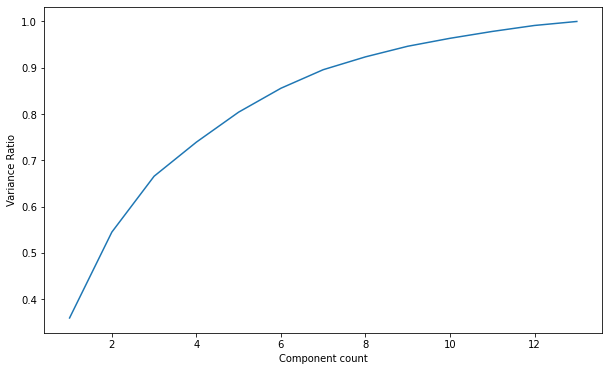

In [50]:
from sklearn.decomposition import PCA
pca = PCA().fit(X_train_scaled)
x = range(1,14)
plt.plot(x,np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Component count")
plt.ylabel("Variance Ratio");

In [51]:
pca = PCA(n_components=13).fit(X_train_scaled)

In [52]:
my_dict = {"explained_variance":pca.explained_variance_, 
           "explained_variance_ratio":pca.explained_variance_ratio_,
           "cumsum_explained_variance_ratio":pca.explained_variance_ratio_.cumsum()}

In [53]:
df_ev = pd.DataFrame(my_dict, index = range(1,14))
df_ev

# explained_variance: Lambda değeri
# explained_variance_ratio: Bileşenlerin içerdiği bilgi(1. bileşen %35 lik bilgi içeriyormuş)
# cumsum_explained_variance_ratio : Bileşenlerin içerdiği bilgilerin kümülatif toplam değerleri

,explained_variance,explained_variance_ratio,cumsum_explained_variance_ratio
1,4.706713,0.359505,0.359505
2,2.428244,0.185473,0.544978
3,1.580507,0.120721,0.665699
4,0.964060,0.073636,0.739335
5,0.848632,0.064820,0.804155
6,0.675462,0.051593,0.855748
7,0.524426,0.040056,0.895804
8,0.363173,0.027740,0.923544
9,0.300204,0.022930,0.946474
10,0.224731,0.017165,0.963639


#### En yüksek değişim bu yönde.. Kırmızı çizgi 1. eigen vector
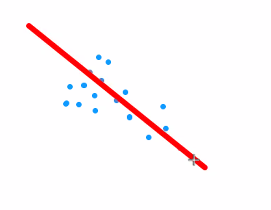

In [54]:
# Feature selection da 3 tane feature seçmiştik. PCA de de 3 feature ı alalım
pca = PCA(n_components = 3)  # Burada n_components = 3 yerine 0.66(0.54-0.66 arası) vs de diyebiliriz

In [55]:
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [56]:
df_pca_train = pd.DataFrame(X_train_pca)
df_pca_train = df_pca_train.rename(columns={0:"first_component", 1:"second_component", 2:"third_component"})
df_pca_train.head()
# Burada component lerden konuşuyoruz artık

,first_component,second_component,third_component
0,-0.783937,-1.590432,0.568115
1,-1.792083,0.583400,-1.321347
2,2.101051,2.109598,0.790712
3,3.107242,0.448619,-1.057832
4,0.725718,-2.107998,0.588435


In [57]:
df_pca_test=pd.DataFrame(X_test_pca)
df_pca_test = df_pca_test.rename(columns={0:"first_component", 1:"second_component", 2:"third_component"})
df_pca_test.head()
# Bu değerlere bakıp bir yorumlama yapamıyoruz. Dezavantajlarından biri buydu

,first_component,second_component,third_component
0,0.510682,-1.703429,0.476175
1,-1.431099,0.675556,0.335034
2,1.517576,-1.098461,-1.110562
3,-2.504356,1.651059,-0.292180
4,-0.335949,-2.097911,-2.503081


In [58]:
df_pca_train.corr().round()
# Komponentler arasındaki ilişki 0
# Kendileriyle ilişki 1
# Vektörler birbirine dik bundan dolayı Cosθ dan dolayı çarpım 0 geliyor

,first_component,second_component,third_component
first_component,1.0,0.0,0.0
second_component,0.0,1.0,0.0
third_component,0.0,0.0,1.0


### Modeling after PCA

In [59]:
classifier3 = RandomForestClassifier(random_state = 0, max_depth=2)
classifier3.fit(X_train_pca, y_train)
eval_metric(classifier3, X_train_pca, y_train, X_test_pca, y_test)
# Performansımız iyi. Hemen hemen aynı sonuçları elde etmiş olduk

Test_Set
[[11  1  0]
 [ 1 13  0]
 [ 0  0 10]]
              precision    recall  f1-score   support

           1       0.92      0.92      0.92        12
           2       0.93      0.93      0.93        14
           3       1.00      1.00      1.00        10

    accuracy                           0.94        36
   macro avg       0.95      0.95      0.95        36
weighted avg       0.94      0.94      0.94        36


Train_Set
[[46  1  0]
 [ 3 53  1]
 [ 0  0 38]]
              precision    recall  f1-score   support

           1       0.94      0.98      0.96        47
           2       0.98      0.93      0.95        57
           3       0.97      1.00      0.99        38

    accuracy                           0.96       142
   macro avg       0.96      0.97      0.97       142
weighted avg       0.97      0.96      0.96       142



In [60]:
from sklearn.pipeline import Pipeline

In [61]:
# Cross validation
operations = [("scaler", StandardScaler()), ("PCA",PCA(n_components=3)),
              ("RF", RandomForestClassifier(random_state = 0, max_depth=2))]

pipe_model = Pipeline(steps=operations)                              
scores = cross_validate(pipe_model, X_train, y_train, scoring = ['accuracy', 'precision_macro','recall_macro','f1_macro'], 
                        cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]     
# 3 bileşen kullanarak sonuçlar

test_accuracy           0.957143
test_precision_macro    0.964127
test_recall_macro       0.964444
test_f1_macro           0.960736
dtype: float64

### Interpreting PCA results

In [62]:
# Interpret etmek çok karşılaşılan bir şey değil ama karşılaşırsak ne yapacağız bakalım

In [63]:
scaled_df = pd.DataFrame(X_train_scaled, columns = df.columns[:-1])

In [64]:
combined_df = pd.concat([df_pca_train, scaled_df], axis=1)
# 3 component e 13 feature u ekliyoruz
# Amacımız bunların arasındaki ilişkiyi görmek

In [65]:
correlation = combined_df.corr()
correlation

# Alcohol ün first componentle arasındaki ilişki -0.315917 .. Ne kadar etkisi olduğunu gösteriyor
# Bu bize lazım değil ama karşınıza çıkar diye gösteriyoruz
# 

,first_component,second_component,third_component,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
first_component,1.000000e+00,1.085356e-16,1.535839e-16,-0.315917,0.522374,-0.041560,0.457484,-0.297626,-0.858881,-0.910155,0.647516,-0.661573,0.157077,-0.703526,-0.796406,-0.651453
second_component,1.085356e-16,1.000000e+00,2.419598e-16,0.759174,0.314529,0.481679,-0.033691,0.471424,0.089916,-0.016412,0.122430,0.060781,0.847400,-0.340077,-0.332120,0.556237
third_component,1.535839e-16,2.419598e-16,1.000000e+00,-0.250287,0.138850,0.764486,0.798863,0.165145,0.186767,0.187314,0.162821,0.177221,-0.138940,0.042489,0.218051,-0.202532
Alcohol,-3.159174e-01,7.591742e-01,-2.502869e-01,1.000000,0.086124,0.201450,-0.315958,0.249971,0.287509,0.224431,-0.089860,0.123973,0.541419,0.040125,0.023660,0.652054
Malic_Acid,5.223736e-01,3.145289e-01,1.388497e-01,0.086124,1.000000,0.123963,0.272138,-0.071824,-0.313270,-0.384919,0.328954,-0.201117,0.203619,-0.534350,-0.365818,-0.216060
Ash,-4.156029e-02,4.816793e-01,7.644857e-01,0.201450,0.123963,1.000000,0.499520,0.295116,0.162924,0.149936,0.158610,0.049224,0.251937,-0.036072,0.025333,0.204146
Ash_Alcanity,4.574839e-01,-3.369122e-02,7.988626e-01,-0.315958,0.272138,0.499520,1.000000,-0.037198,-0.270902,-0.290175,0.330071,-0.170231,-0.025659,-0.252200,-0.192587,-0.458074
Magnesium,-2.976258e-01,4.714238e-01,1.651446e-01,0.249971,-0.071824,0.295116,-0.037198,1.000000,0.227277,0.181490,-0.249800,0.181372,0.223524,0.099632,0.029348,0.379295
Total_Phenols,-8.588813e-01,8.991650e-02,1.867672e-01,0.287509,-0.313270,0.162924,-0.270902,0.227277,1.000000,0.860816,-0.441993,0.612551,-0.043103,0.483347,0.699105,0.497085
Flavanoids,-9.101552e-01,-1.641220e-02,1.873139e-01,0.224431,-0.384919,0.149936,-0.290175,0.181490,0.860816,1.000000,-0.511210,0.649661,-0.146488,0.576261,0.775939,0.509639


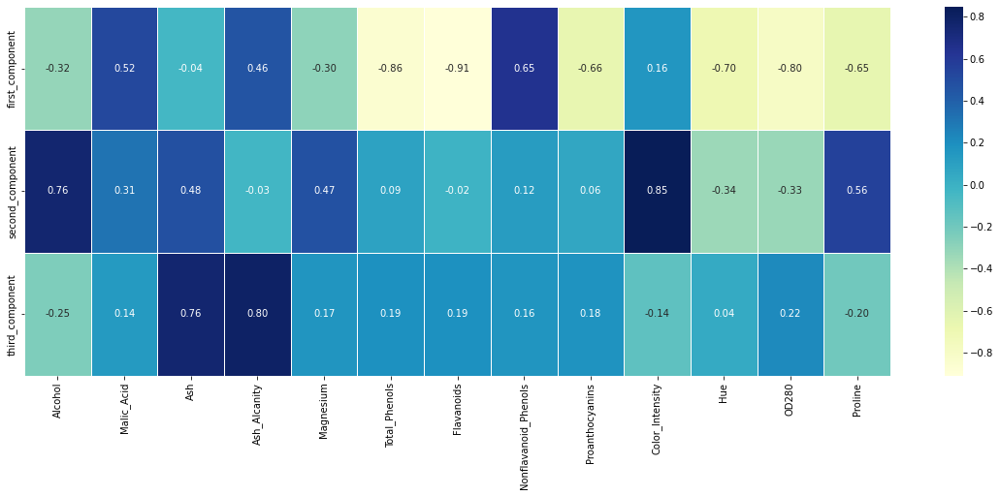

In [66]:
fig, ax = plt.subplots(figsize=(20, 7))
sns.heatmap(correlation.iloc[:3,3:], cmap='YlGnBu', linewidths=.7, annot=True, fmt='.2f')
plt.show()
# 3 component ile her bir feature arasındaki ilişkiyi gösteren heatmap

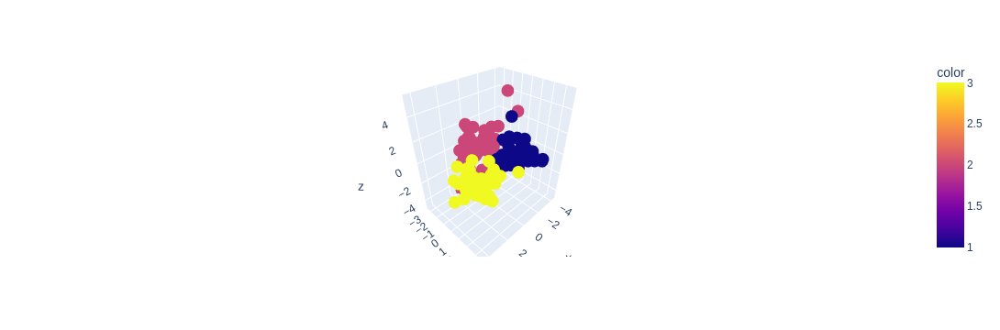

In [67]:
import plotly.express as px
fig = px.scatter_3d(x=df_pca_train["first_component"], y=df_pca_train["second_component"], 
                    z=df_pca_train["third_component"], color=y_train)
fig.show()

# 3 component i 3 boyutlu uzayda çizdirdiğimizde birbirlerinden daha kolay ayrılabildiği söylenebilir

In [68]:
# Class chat soru: Componentler arasında corelasyonun sıfır olmasında birbirleri ile yakın olan featureların bir component olmasının etkisi var mı?
# Orion hoca: her componentte her featuredan belli oranda bilgi var. mesela 18 feature var ise herhangi bir componentin içinde 18 featuredan bilgi bulunur
# .. ama miktarları farklıdır

# Class chat soru: regressionda da kullanuliyormu  PCA.  uygulaniyorsa sonuclara etkisi genel olarak nasil oluyor.?
# John Hoca: Regresyonda kullanılması çok mantıklı değil çünkü ürettiği değer dönüşmüş bir değer ve bunun inverse ünü yapamıyoruz
# .. scaling i inverse scaling yapıyoruz ama PCA i geri döndüremeyiz

In [69]:
# SUNUM

In [70]:
# John Hoca: 6-7 tane insandan aldığım bilgiler

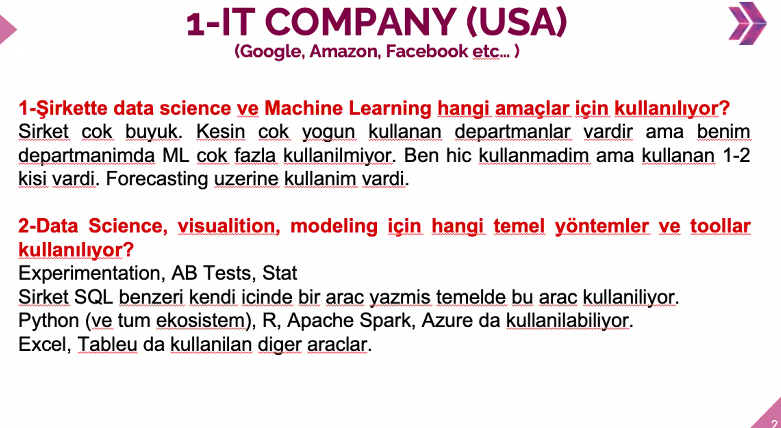

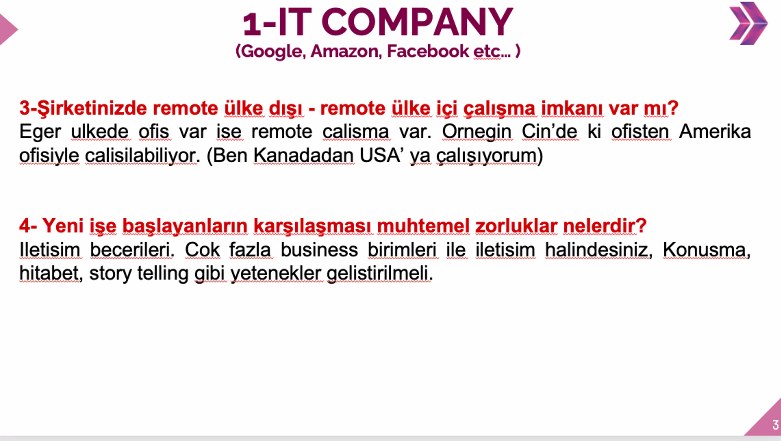

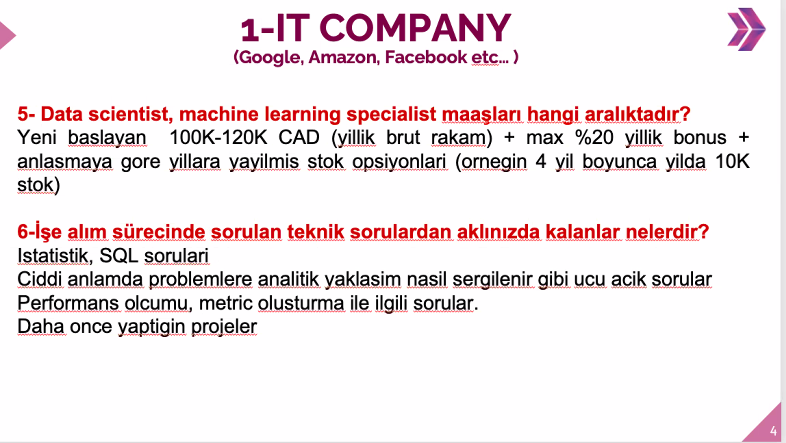

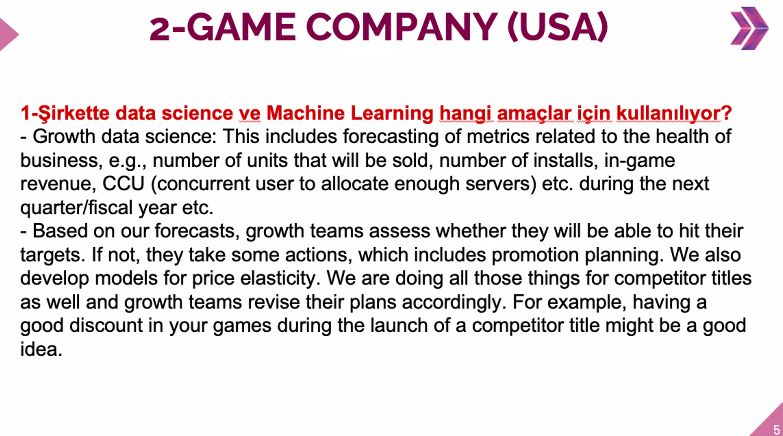

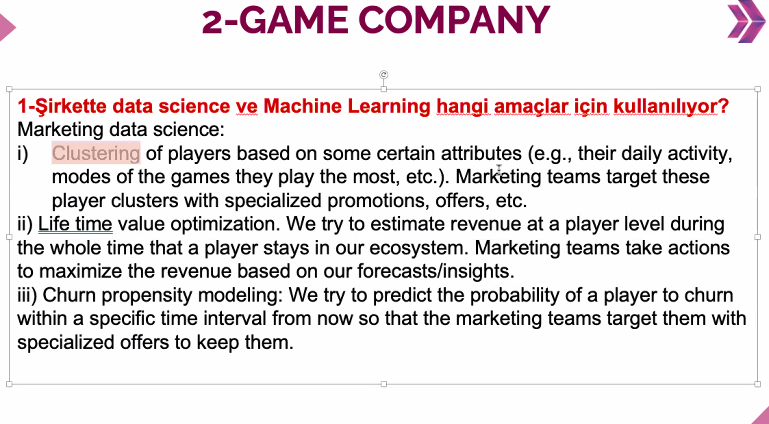

...

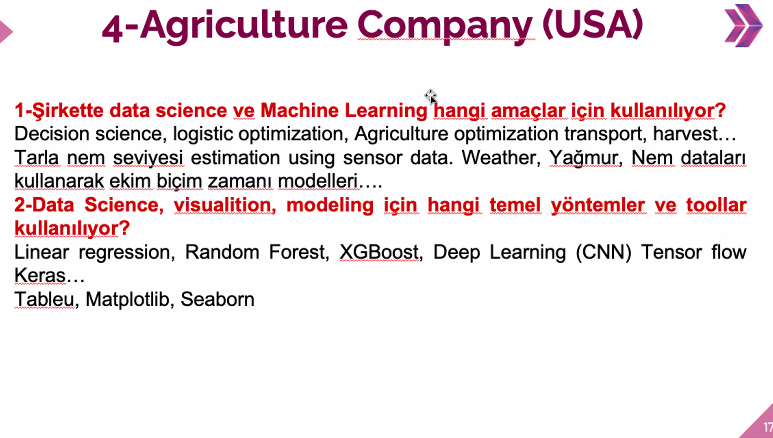

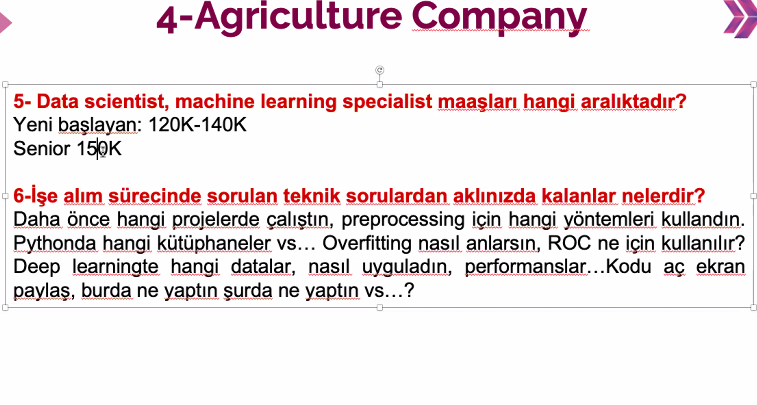

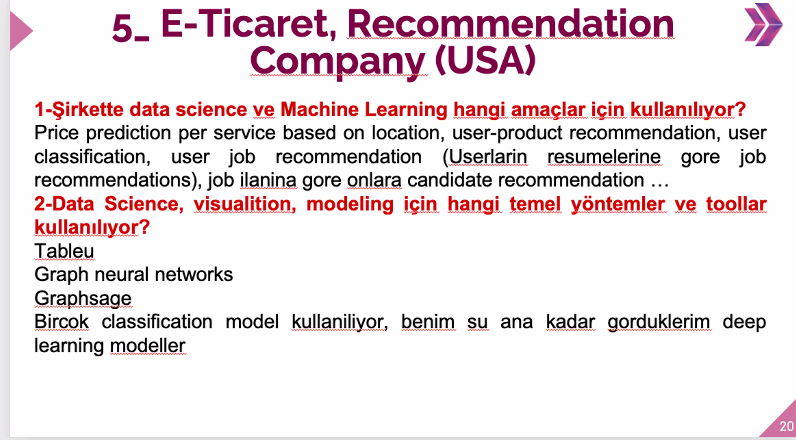

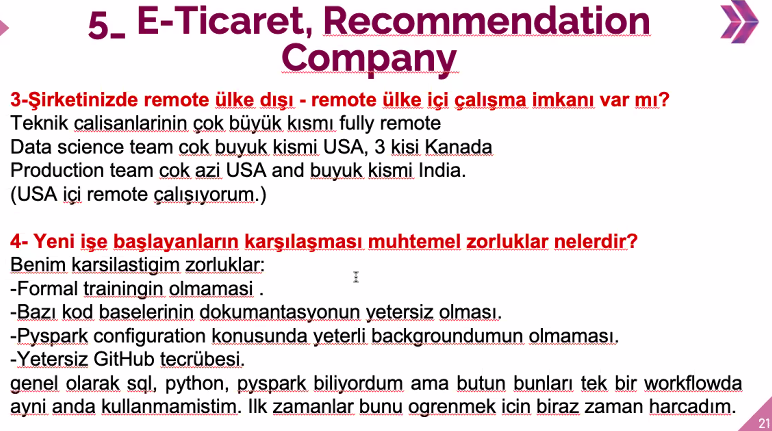

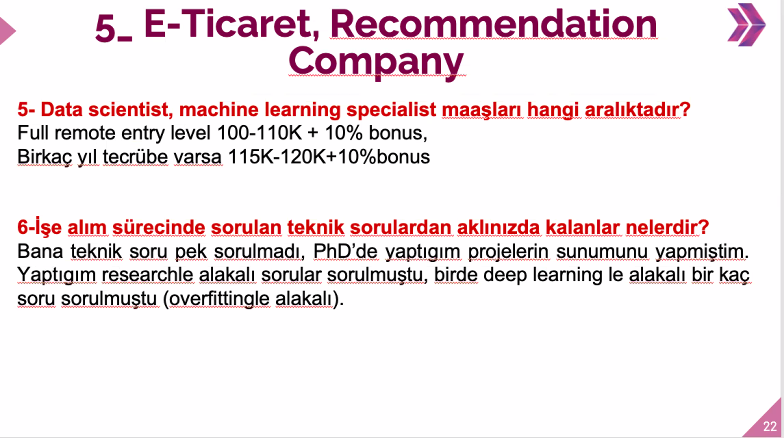